In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/sample_submission.csv
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_series_descriptions.csv
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train.csv
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_label_coordinates.csv
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/test_series_descriptions.csv
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/1737682527/2291122880/12.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/1737682527/2291122880/18.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/1737682527/2291122880/9.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/1737682527/2291122880/14.dcm
/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/1737682527/2291122880/11.dcm
/kaggle/input/rsna-202

In [2]:
#load csv files
train_df = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train.csv')
label_coords_df = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_label_coordinates.csv')
train_series_desc_df = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_series_descriptions.csv')
sample_submission_df = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/sample_submission.csv')
test_series_desc_df = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/test_series_descriptions.csv')

In [3]:
#display first 5 rows of each dataframe
print(train_df.head(5))
print(label_coords_df.head(5))
print(train_series_desc_df.head(5))
print(sample_submission_df.head(5))
print(test_series_desc_df.head(5))

   study_id spinal_canal_stenosis_l1_l2 spinal_canal_stenosis_l2_l3  \
0   4003253                 Normal/Mild                 Normal/Mild   
1   4646740                 Normal/Mild                 Normal/Mild   
2   7143189                 Normal/Mild                 Normal/Mild   
3   8785691                 Normal/Mild                 Normal/Mild   
4  10728036                 Normal/Mild                 Normal/Mild   

  spinal_canal_stenosis_l3_l4 spinal_canal_stenosis_l4_l5  \
0                 Normal/Mild                 Normal/Mild   
1                    Moderate                      Severe   
2                 Normal/Mild                 Normal/Mild   
3                 Normal/Mild                 Normal/Mild   
4                 Normal/Mild                 Normal/Mild   

  spinal_canal_stenosis_l5_s1 left_neural_foraminal_narrowing_l1_l2  \
0                 Normal/Mild                           Normal/Mild   
1                 Normal/Mild                           Normal/M

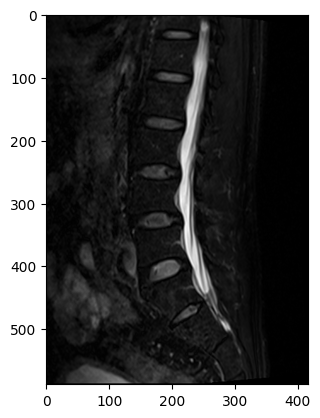

In [4]:
import pydicom
import matplotlib.pyplot as plt

#load and visualize DICOM images
def load_dicom_image(filepath):
    dicom = pydicom.dcmread(filepath)
    image = dicom.pixel_array
    return image

sample_image_path = '/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/1737682527/2291122880/12.dcm'
sample_image = load_dicom_image(sample_image_path)

plt.imshow(sample_image, cmap='gray')
plt.show()

In [5]:
#merge dataframes on 'study_id' and 'series_id'
train_merged_df = pd.merge(label_coords_df, train_series_desc_df, on=['study_id', 'series_id'])
train_merged_df = pd.merge(train_merged_df, train_df, on='study_id')

#display the merged dataframe
print(train_merged_df.head())

   study_id  series_id  instance_number              condition  level  \
0   4003253  702807833                8  Spinal Canal Stenosis  L1/L2   
1   4003253  702807833                8  Spinal Canal Stenosis  L2/L3   
2   4003253  702807833                8  Spinal Canal Stenosis  L3/L4   
3   4003253  702807833                8  Spinal Canal Stenosis  L4/L5   
4   4003253  702807833                8  Spinal Canal Stenosis  L5/S1   

            x           y series_description spinal_canal_stenosis_l1_l2  \
0  322.831858  227.964602   Sagittal T2/STIR                 Normal/Mild   
1  320.571429  295.714286   Sagittal T2/STIR                 Normal/Mild   
2  323.030303  371.818182   Sagittal T2/STIR                 Normal/Mild   
3  335.292035  427.327434   Sagittal T2/STIR                 Normal/Mild   
4  353.415929  483.964602   Sagittal T2/STIR                 Normal/Mild   

  spinal_canal_stenosis_l2_l3  ... left_subarticular_stenosis_l1_l2  \
0                 Normal/Mild  ..

In [6]:
print("Available columns in train merged DataFrame:", train_merged_df.columns.tolist())

Available columns in train merged DataFrame: ['study_id', 'series_id', 'instance_number', 'condition', 'level', 'x', 'y', 'series_description', 'spinal_canal_stenosis_l1_l2', 'spinal_canal_stenosis_l2_l3', 'spinal_canal_stenosis_l3_l4', 'spinal_canal_stenosis_l4_l5', 'spinal_canal_stenosis_l5_s1', 'left_neural_foraminal_narrowing_l1_l2', 'left_neural_foraminal_narrowing_l2_l3', 'left_neural_foraminal_narrowing_l3_l4', 'left_neural_foraminal_narrowing_l4_l5', 'left_neural_foraminal_narrowing_l5_s1', 'right_neural_foraminal_narrowing_l1_l2', 'right_neural_foraminal_narrowing_l2_l3', 'right_neural_foraminal_narrowing_l3_l4', 'right_neural_foraminal_narrowing_l4_l5', 'right_neural_foraminal_narrowing_l5_s1', 'left_subarticular_stenosis_l1_l2', 'left_subarticular_stenosis_l2_l3', 'left_subarticular_stenosis_l3_l4', 'left_subarticular_stenosis_l4_l5', 'left_subarticular_stenosis_l5_s1', 'right_subarticular_stenosis_l1_l2', 'right_subarticular_stenosis_l2_l3', 'right_subarticular_stenosis_l3_

In [7]:
#check if there are missing values
train_merged_df.isnull().sum()

study_id                                     0
series_id                                    0
instance_number                              0
condition                                    0
level                                        0
x                                            0
y                                            0
series_description                           0
spinal_canal_stenosis_l1_l2                  0
spinal_canal_stenosis_l2_l3                  0
spinal_canal_stenosis_l3_l4                  0
spinal_canal_stenosis_l4_l5                  0
spinal_canal_stenosis_l5_s1                  0
left_neural_foraminal_narrowing_l1_l2       30
left_neural_foraminal_narrowing_l2_l3       30
left_neural_foraminal_narrowing_l3_l4       30
left_neural_foraminal_narrowing_l4_l5       30
left_neural_foraminal_narrowing_l5_s1       30
right_neural_foraminal_narrowing_l1_l2     180
right_neural_foraminal_narrowing_l2_l3     180
right_neural_foraminal_narrowing_l3_l4     180
right_neural_

In [8]:
from sklearn.impute import SimpleImputer

#identify columns with non-numeric data
non_numeric_cols = train_merged_df.select_dtypes(include=['object', 'category']).columns
numerical_cols = train_merged_df.select_dtypes(include=['number']).columns

#separate categorical and numerical features
categorical_features_with_na = [col for col in non_numeric_cols if col in train_merged_df.columns]
numerical_features_with_na = [col for col in numerical_cols if col in train_merged_df.columns]

In [9]:
cat_imputer = SimpleImputer(strategy='most_frequent')
train_merged_df[categorical_features_with_na] = cat_imputer.fit_transform(train_merged_df[categorical_features_with_na])

In [10]:
num_imputer = SimpleImputer(strategy='median')
train_merged_df[numerical_features_with_na] = num_imputer.fit_transform(train_merged_df[numerical_features_with_na])

In [11]:
print(train_merged_df.isnull().sum())

study_id                                  0
series_id                                 0
instance_number                           0
condition                                 0
level                                     0
x                                         0
y                                         0
series_description                        0
spinal_canal_stenosis_l1_l2               0
spinal_canal_stenosis_l2_l3               0
spinal_canal_stenosis_l3_l4               0
spinal_canal_stenosis_l4_l5               0
spinal_canal_stenosis_l5_s1               0
left_neural_foraminal_narrowing_l1_l2     0
left_neural_foraminal_narrowing_l2_l3     0
left_neural_foraminal_narrowing_l3_l4     0
left_neural_foraminal_narrowing_l4_l5     0
left_neural_foraminal_narrowing_l5_s1     0
right_neural_foraminal_narrowing_l1_l2    0
right_neural_foraminal_narrowing_l2_l3    0
right_neural_foraminal_narrowing_l3_l4    0
right_neural_foraminal_narrowing_l4_l5    0
right_neural_foraminal_narrowing

In [12]:
from sklearn.model_selection import train_test_split

#define your target and features
X = train_merged_df.drop(columns=['condition'])
y = train_merged_df['condition']

#split the data
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [13]:
from sklearn.preprocessing import LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

#define categorical columns
categorical_features = [
    'level', 'series_description',
    'spinal_canal_stenosis_l1_l2', 'spinal_canal_stenosis_l2_l3',
    'spinal_canal_stenosis_l3_l4', 'spinal_canal_stenosis_l4_l5',
    'spinal_canal_stenosis_l5_s1', 'left_neural_foraminal_narrowing_l1_l2',
    'left_neural_foraminal_narrowing_l2_l3', 'left_neural_foraminal_narrowing_l3_l4',
    'left_neural_foraminal_narrowing_l4_l5', 'left_neural_foraminal_narrowing_l5_s1',
    'right_neural_foraminal_narrowing_l1_l2', 'right_neural_foraminal_narrowing_l2_l3',
    'right_neural_foraminal_narrowing_l3_l4', 'right_neural_foraminal_narrowing_l4_l5',
    'right_neural_foraminal_narrowing_l5_s1', 'left_subarticular_stenosis_l1_l2',
    'left_subarticular_stenosis_l2_l3', 'left_subarticular_stenosis_l3_l4',
    'left_subarticular_stenosis_l4_l5', 'left_subarticular_stenosis_l5_s1',
    'right_subarticular_stenosis_l1_l2', 'right_subarticular_stenosis_l2_l3',
    'right_subarticular_stenosis_l3_l4', 'right_subarticular_stenosis_l4_l5',
    'right_subarticular_stenosis_l5_s1'
]

#apply OneHotEncoding
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ],
    remainder='passthrough'
)

#fit and transform the data
X_train_transformed = preprocessor.fit_transform(X_train)
X_val_transformed = preprocessor.transform(X_val)

#encode labels
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_val_encoded = le.transform(y_val)

#train the model
model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
model.fit(X_train_transformed, y_train_encoded)

#predict and evaluate
y_pred_encoded = model.predict(X_val_transformed)
y_pred = le.inverse_transform(y_pred_encoded)

#calculate accuracy
accuracy = accuracy_score(y_val, y_pred)
accuracy_percentage = accuracy * 100
print(f"The accuracy score is {accuracy_percentage:.2f}%")

#get row IDs for submission
row_ids = X_val.index  #assuming 'row_id' is the index of X_val

#get predicted probabilities for each class
pred_prob = model.predict_proba(X_val_transformed)

#create submission DataFrame
submission_df = pd.DataFrame({
    'row_id': row_ids,
    'normal_mild': pred_prob[:, 0].clip(0, 1),
    'moderate': pred_prob[:, 1].clip(0, 1),
    'severe': pred_prob[:, 2].clip(0, 1)
})

#replace NaN values with 0 for all columns
submission_df.fillna(0, inplace=True)

#apply any_severe_scalar (set 'severe' column to 1.0 if any severe case is detected)
submission_df['severe'] = np.where(submission_df[['normal_mild', 'moderate', 'severe']].sum(axis=1) > 0, 1.0, 0)

#save the submission file
submission_df.to_csv('/kaggle/working/submission.csv', index=False)

The accuracy score is 91.16%
